# ResNet50-v2
- fine-tuned on clothing

https://tfhub.dev/google/experts/bit/r50x1/in21k/clothing/1

In [12]:
import os
import pandas as pd
import tensorflow_hub as hub
import tensorflow as tf
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from tqdm.notebook import tqdm # 반복문의 진행상황 확인하는 모듈
import glob
import time
from scipy.spatial import distance

In [13]:
tqdm

tqdm.notebook.tqdm_notebook

In [14]:
# 경고창 끄기
import warnings
warnings.filterwarnings('ignore')

In [15]:
model_url = "https://tfhub.dev/google/experts/bit/r50x1/in21k/clothing/1"

IMAGE_SHAPE = (224, 224)

layer = hub.KerasLayer(model_url, input_shape=IMAGE_SHAPE+(3,))
model = tf.keras.Sequential([layer])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 2048)              23500352  
                                                                 
Total params: 23,500,352
Trainable params: 0
Non-trainable params: 23,500,352
_________________________________________________________________


In [114]:
model.build([None, 224, 224, 3])

In [123]:
def extract(file):
    file = Image.open(file).convert('RGB').resize(IMAGE_SHAPE)
    # plt.imshow(file)

    file = np.array(file)/255.0 # 정규화
    embedding = model.predict(file[np.newaxis, ...])
    ResNet50_feature_np = np.array(embedding)
    flattended_feature = ResNet50_feature_np.flatten()
    return flattended_feature

In [124]:
extract('newera.jpg')

1/1 [==============================] - 0s 91ms/step


array([0.00581382, 0.        , 0.84483945, ..., 0.        , 0.75114846,
       0.        ], dtype=float32)

In [18]:
def make_dataframe(category):
    path = f"../crops/{category}/"
    file_list = os.listdir(path)
    file_list_img = [file for file in file_list if file.endswith(".png") or file.endswith(".jpeg") or file.endswith(".jpg")]
    tmp_df = pd.DataFrame()
    for i, img in enumerate(tqdm(file_list_img)):
        output = extract(path+'/'+img)
        tmp_df = tmp_df.append({'filename':img, 'output':output}, ignore_index=True)

    np.save(path+f'{category}_filename(ResNet50).npy', tmp_df['filename'])
    np.save(path+f'{category}_output(ResNet50).npy', tmp_df['output']) # np.array배열 형태로 나중에 불러오기 위해 따로 저장

In [81]:
make_dataframe('cap');

  0%|          | 0/3429 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


In [51]:
def get_dataframe(category):
    path = f"../crops/{category}/"
    tmp_filename = np.load(path+f'{category}_filename(ResNet50).npy', allow_pickle=True)
    tmp_output = np.load(path+f'{category}_output(ResNet50).npy', allow_pickle=True)
    df = pd.DataFrame({'filename':tmp_filename, 'output':tmp_output})
    return df

In [53]:
def get_cos_sim(file, category, metric='cosine'):
    before_time = time.time()
    file2vec = extract(file) # 이미지 벡터화
    df = get_dataframe(category) # 데이터프레임 가져오기
    df = df.append({'filename':file, 'output':file2vec}, ignore_index=True)
    
    cos_sim_array = np.zeros((len(df)))
    for i in range(0, len(df)):
        cos_sim_array[i] = distance.cdist([file2vec] , [df.iloc[i, 1]], metric)[0] # 벡터화된 이미지 기준
    df['cos_sim']=cos_sim_array
    after_time = time.time()
    runtime = after_time-before_time
    return df, runtime # 런타임 비교용

In [128]:
def show_sim(filename, category):
    path = f"../crops/{category}/"
    cos_sim_df, runtime = get_cos_sim(filename, category)
    df_top_sim = cos_sim_df.sort_values(by='cos_sim')[:30]

    # 그래프 그리는 부분은 서비스 시 생략 가능
    f, ax = plt.subplots(6, 5, figsize=(40, 40))

    for i in range(len(df_top_sim)):
        if i == 0: 
            tmp_img = Image.open(df_top_sim.iloc[i, 0]).convert('RGB')
            title = f'Original \n{df_top_sim.iloc[i, 0]}'
        else : 
            tmp_img = Image.open(path+'/'+df_top_sim.iloc[i, 0]).convert('RGB')
            title = f'similarity no.{i} \n{df_top_sim.iloc[i, 0]}'

        sim = f'cos : {df_top_sim.iloc[i, 2]:.3f}' 
        ax[i//5][i%5].imshow(tmp_img, aspect='auto')
        ax[i//5][i%5].set_title(title, pad=20, size=25) # 5열짜리 표를 만드는 것이므로 단순히 5로 나눈 나머지와 몫을 사용한 것임
        ax[i//5][i%5].annotate(sim, (0,10), fontsize=18, color='red')
    
    print(f'소요시간 : {runtime:.3f}')
    plt.savefig('ResNetv2(clothing)_bluecap.jpg')
    plt.show()

1/1 [==============================] - 0s 220ms/step
소요시간 : 0.413


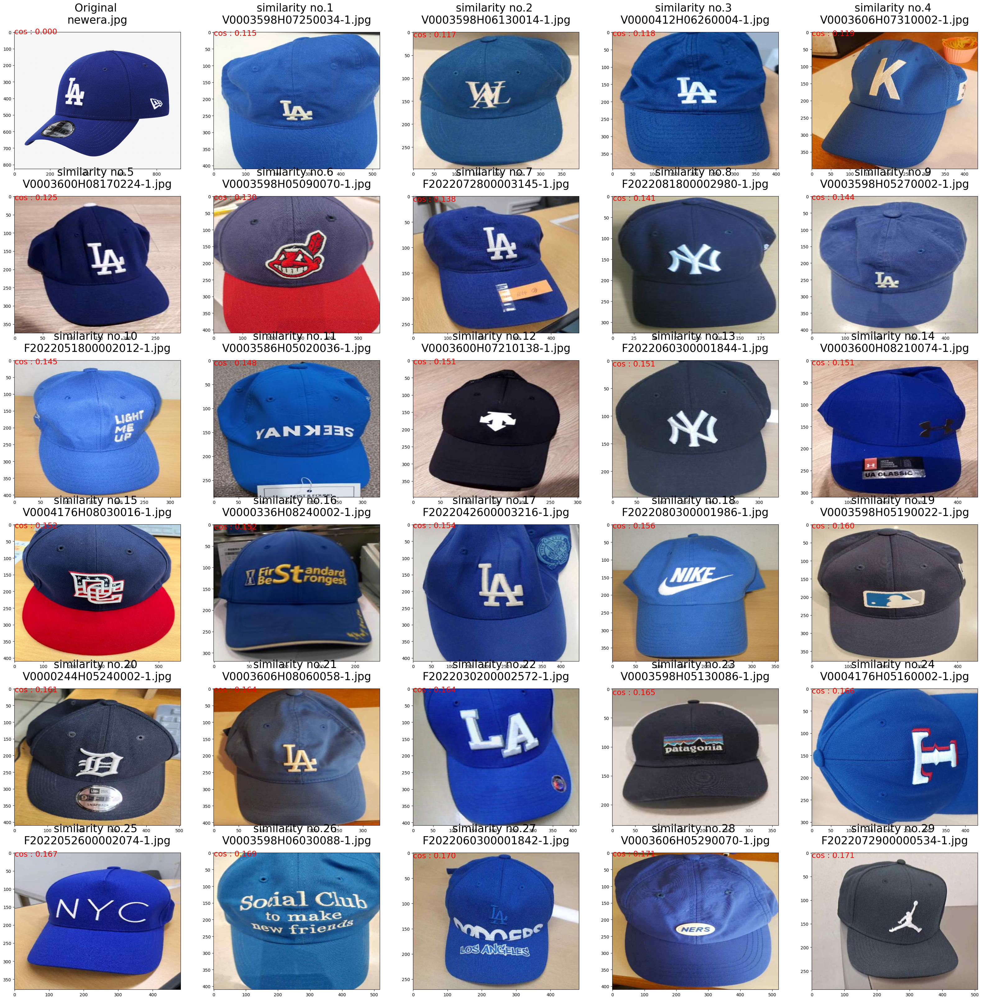

In [129]:
show_sim('newera.jpg', 'cap')

In [99]:
def get_runtime():
    runtime_list = list()
    for i in range(100):
        df, runtime = get_cos_sim('cap_marant.jpg', 'cap')
        runtime_list.append(runtime)
    runtime_mean = np.mean(runtime_list)
    print(f'100회 평균 소요시간 : {runtime_mean:.3f}')

get_runtime()

1/1 [==============================] - 0s 38ms/step
100회 평균 소요시간 : 0.146
